# 2019/01/18    - test campaign 1, day 5

##    3.8 Measure M1 and M3 influence functions (M1 IF 1-15 only; M3 IF 1-30)

In [1]:
from M1M3tools import *
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import glob

%matplotlib inline
plt.jet()

dateID = 190118
testID = '3-8' 

<Figure size 432x288 with 0 Axes>

In [2]:
import pandas as pd
pattern = '%s/Processed/%d_%s Influence Functions/*filename list.xlsx'%(
    dataDir, dateID, testID)
summaryFile = glob.glob(pattern)[0]
df = pd.read_excel(summaryFile, sheet_name = 'Corrected Maps', skiprows=1)
idx = np.unique(df['Actuator'], return_index=True)[1]
mode2actID = [df['Actuator'][idx] for idx in sorted(idx)]

## We made the following measurements on this day

### M3 single actuator influence function: 1-30. 
The list of actuators ranked by priority were given to the Mirror Lab by LSST

We did M3 first because M3 measurements (20x2s) take much shorter time than M1 (50x2s). See 190115.ipynb

3-8 Influence function 1 --- Actuator 126 --- irow = 0, icol = 0, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if+1-1 burst20 morph -.h5: Fri Jan 18 09:48:26 2019 
3-8 Influence function 1 --- Actuator 126 --- irow = 0, icol = 1, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if-1-1 burst20 morph -.h5: Fri Jan 18 09:50:31 2019 
3-8 Influence function 1 --- Actuator 126 --- irow = 0, icol = 2, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if-1-2 burst20 morph -.h5: Fri Jan 18 09:51:51 2019 
3-8 Influence function 1 --- Actuator 126 --- irow = 0, icol = 3, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if+1-2 burst20 morph -.h5: Fri Jan 18 09:53:23 2019 
3-8 Influence function 2 --- Actuator 113 --- irow = 1, icol = 0, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if+2-1 burst20 morph -.h5: F

3-8 Influence function 11 --- Actuator 106 --- irow = 10, icol = 2, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if-11-2 burst20 morph -.h5: Fri Jan 18 11:08:59 2019 
3-8 Influence function 11 --- Actuator 106 --- irow = 10, icol = 3, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if+11-2 burst20 morph -.h5: Fri Jan 18 11:10:26 2019 
3-8 Influence function 12 --- Actuator 112 --- irow = 11, icol = 0, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if+12-1 burst20 morph -.h5: Fri Jan 18 11:12:16 2019 
3-8 Influence function 12 --- Actuator 112 --- irow = 11, icol = 1, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if-12-1 burst20 morph -.h5: Fri Jan 18 11:13:44 2019 
3-8 Influence function 12 --- Actuator 112 --- irow = 11, icol = 2, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if-12-2 burst2

3-8 Influence function 22 --- Actuator 411 --- irow = 21, icol = 3, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if+22-2 burst20 morph -.h5: Fri Jan 18 12:24:02 2019 
3-8 Influence function 23 --- Actuator 433 --- irow = 22, icol = 0, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if+23-1 burst20 morph -.h5: Fri Jan 18 12:30:22 2019 
3-8 Influence function 23 --- Actuator 433 --- irow = 22, icol = 1, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if-23-1 burst20 morph -.h5: Fri Jan 18 12:31:26 2019 
3-8 Influence function 23 --- Actuator 433 --- irow = 22, icol = 2, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if-23-2 burst20 morph -.h5: Fri Jan 18 12:32:19 2019 
3-8 Influence function 23 --- Actuator 433 --- irow = 22, icol = 3, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M3 if+23-2 burst2

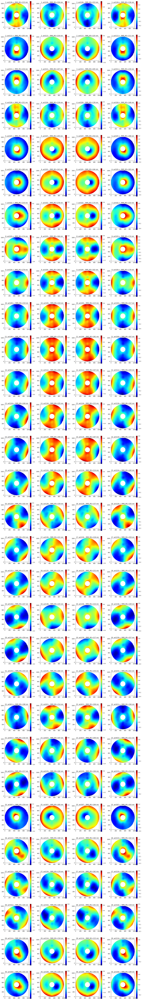

In [5]:
testID = '3-8' 
fig, ax = plt.subplots(30,4,figsize=(20,5*30))
i = 0
for modeID in range(1,31):
    signedBend = ['+%d-1'%modeID, '-%d-1'%modeID, '-%d-2'%modeID, '+%d-2'%modeID]
    for bend in signedBend:
        irow = np.int8(i/4)
        icol = np.mod(i,4)
        i += 1
        print('%s Influence function %s --- Actuator %d --- irow = %d, icol = %d, -----------------------------'%(
            testID, modeID, mode2actID[modeID-1], irow, icol))
        fileset = sorted(glob.glob('%s/Processed/%d_%s Influence Functions/%d %s M3 if%s*burst*morph -.h5'%(
            dataDir, dateID, testID, dateID, testID, bend)))
        m3s,centerRow1,centerCol1,pixelSize1 = readH5Map(fileset)

        m3rms = np.std(m3s[~np.isnan(m3s)])*1000 #convert into nm

        img = ax[irow][icol].imshow(m3s, origin='lower')
        fig.colorbar(img, ax=ax[irow][icol])
        ax[irow][icol].set_title('%d, act%d,%s, RMS_M1=%.0f nm'%(modeID, mode2actID[modeID-1], bend[0], m3rms))


### M1 single actuator influence function: 1-15. 
The list of actuators ranked by priority were given to the Mirror Lab by LSST

3-8 Influence function 1 --- Actuator 126 --- irow = 0, icol = 0, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M1 if+1-1 burst50 morph -.h5: Fri Jan 18 13:43:18 2019 
3-8 Influence function 1 --- Actuator 126 --- irow = 0, icol = 1, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M1 if-1-1 burst50 morph -.h5: Fri Jan 18 13:46:28 2019 
3-8 Influence function 1 --- Actuator 126 --- irow = 0, icol = 2, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M1 if-1-2 burst50 morph -.h5: Fri Jan 18 13:49:26 2019 
3-8 Influence function 1 --- Actuator 126 --- irow = 0, icol = 3, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M1 if+1-2 burst50 morph -.h5: Fri Jan 18 13:52:35 2019 
3-8 Influence function 2 --- Actuator 113 --- irow = 1, icol = 0, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M1 if+2-1 burst50 morph -.h5: F

3-8 Influence function 12 --- Actuator 112 --- irow = 11, icol = 1, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M1 if-12-1 burst50 morph -.h5: Fri Jan 18 16:14:26 2019 
3-8 Influence function 12 --- Actuator 112 --- irow = 11, icol = 2, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M1 if-12-2 burst50 morph -.h5: Fri Jan 18 16:17:28 2019 
3-8 Influence function 12 --- Actuator 112 --- irow = 11, icol = 3, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M1 if+12-2 burst50 morph -.h5: Fri Jan 18 16:20:42 2019 
3-8 Influence function 13 --- Actuator 118 --- irow = 12, icol = 0, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M1 if+13-1 burst50 morph -.h5: Fri Jan 18 16:24:18 2019 
3-8 Influence function 13 --- Actuator 118 --- irow = 12, icol = 1, -----------------------------
/Processed/190118_3-8 Influence Functions/190118 3-8 M1 if-13-1 burst5

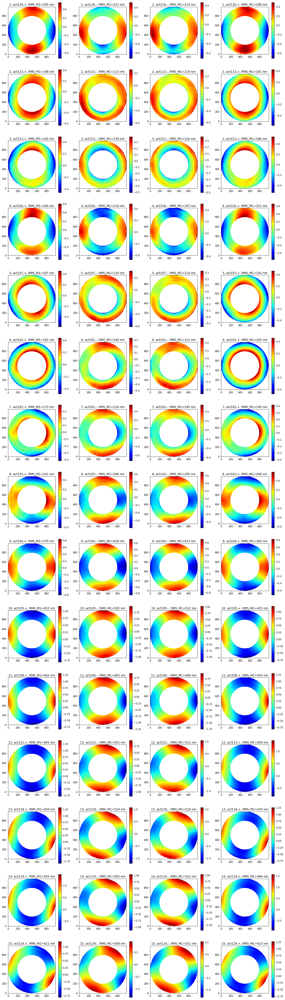

In [6]:
fig, ax = plt.subplots(15,4,figsize=(20,5*15))
i = 0
for modeID in range(1,16):
    signedBend = ['+%d-1'%modeID, '-%d-1'%modeID, '-%d-2'%modeID, '+%d-2'%modeID]
    for bend in signedBend:
        irow = np.int8(i/4)
        icol = np.mod(i,4)
        i += 1
        print('%s Influence function %s --- Actuator %d --- irow = %d, icol = %d, -----------------------------'%(
            testID, modeID, mode2actID[modeID-1], irow, icol))
        fileset = sorted(glob.glob('%s/Processed/%d_%s Influence Functions/%d %s M1 if%s*burst*morph -.h5'%(
            dataDir, dateID, testID, dateID, testID, bend)))
        m1s,centerRow1,centerCol1,pixelSize1 = readH5Map(fileset)

        m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm

        img = ax[irow][icol].imshow(m1s, origin='lowerleft')
        fig.colorbar(img, ax=ax[irow][icol])
        ax[irow][icol].set_title('%d, act%d,%s, RMS_M1=%.0f nm'%(modeID, mode2actID[modeID-1], bend[0], m1rms))

### The Measured single actuator influence functions

3-8 bending mode 101 ------ irow = 0, icol = 0, -----------------------------
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-101.h5: date not in h5 file. 
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-101.h5: date not in h5 file. 
3-8 bending mode 102 ------ irow = 0, icol = 1, -----------------------------
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-102.h5: date not in h5 file. 
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-102.h5: date not in h5 file. 
3-8 bending mode 103 ------ irow = 0, icol = 2, -----------------------------
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-103.h5: date not in h5 file. 
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-103.h5: date not in h5 file. 
3-8 bending mode 104 ------ irow = 0, ic

3-8 bending mode 316 ------ irow = 6, icol = 2, -----------------------------
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-316.h5: date not in h5 file. 
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-316.h5: date not in h5 file. 
3-8 bending mode 326 ------ irow = 6, icol = 3, -----------------------------
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-326.h5: date not in h5 file. 
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-326.h5: date not in h5 file. 
3-8 bending mode 411 ------ irow = 7, icol = 0, -----------------------------
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-411.h5: date not in h5 file. 
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-411.h5: date not in h5 file. 
3-8 bending mode 433 ------ irow = 7, ic

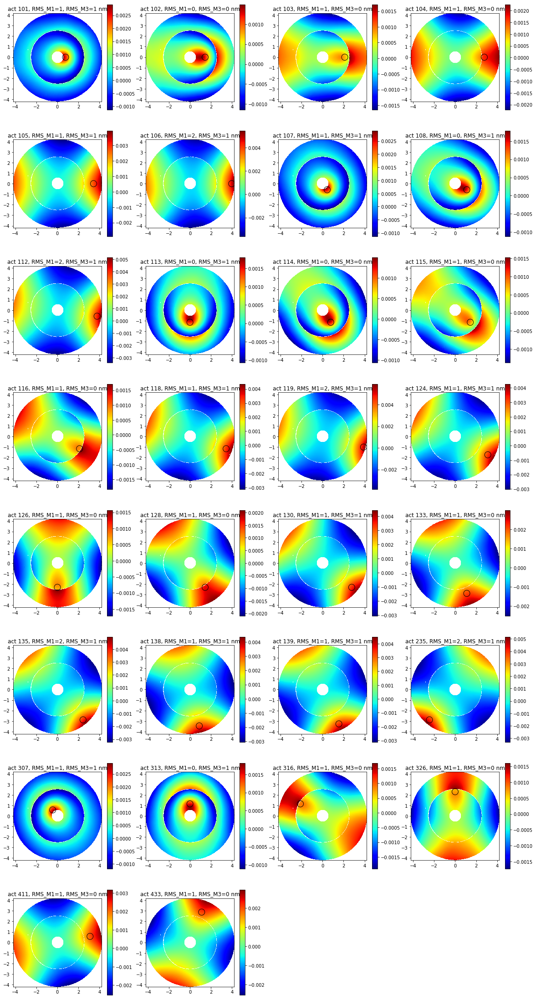

In [7]:
testID = '3-8' 
fig, ax = plt.subplots(8,4,figsize=(20,5*8))
i = 0
for modeID in sorted(mode2actID):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    i += 1
    print('%s bending mode %s ------ irow = %d, icol = %d, -----------------------------'%(
        testID, modeID, irow, icol))
    fileset = sorted(glob.glob('%s/Processed/%d_%s Influence Functions/Combined/*number-%d.h5'%(
    dataDir, dateID, testID, modeID)))
    m1s,centerRow1,centerCol1,pixelSize1 = readH5Map(fileset, '/M1Data')
    m3s,centerRow3,centerCol3,pixelSize3 = readH5Map(fileset, '/M3Data')

    [x1, y1] = mkXYGrid(m1s, centerRow1, centerCol1, pixelSize1)
    [x3, y3] = mkXYGrid(m3s, centerRow3, centerCol3, pixelSize3)
    s = mkM1M3disp(m1s, m3s, x1, y1, x3, y3)
    
    m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
    m3rms = np.std(m3s[~np.isnan(m3s)])*1000 #convert into nm

    img = ax[irow][icol].imshow(s, origin='lowerleft', extent = [x1[0,0], x1[0,-1], y1[0,0], y1[-1,0]])
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title('act %d, RMS_M1=%.0f, RMS_M3=%.0f nm'%(modeID, m1rms, m3rms))
    
    actIdx = np.where(actID == modeID)
    circ = Circle((xact[actIdx],yact[actIdx]),0.3, fill = False)
    ax[irow][icol].add_patch(circ)
    
fig.delaxes(ax.flatten()[-2])
fig.delaxes(ax.flatten()[-1])

### Scaling factors that need to be added to the FEA influence functions

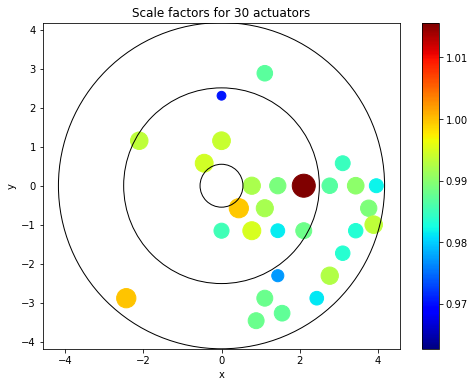

In [8]:
import pandas as pd
resultsFile = glob.glob('%s/Processed/%d_%s Influence Functions/Combined/FittedCoeff*txt'%(
    dataDir, dateID, testID))[0]
df = pd.read_csv(resultsFile, sep="\t")
actID30 = df['Actuator']
scaleF = df['normalizedFit']

xact30 = np.zeros(30)
yact30 = np.zeros(30)
i = 0
for act in actID30:
    idx = np.where(actID == act)[0][0]
    xact30[i]=xact[idx]
    yact30[i]=yact[idx]
    i+=1
    
fig, ax = plt.subplots(1,1,figsize=(8, 6))
img = ax.scatter(xact30, yact30, (scaleF-min(scaleF))*1e4, scaleF)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.axis('equal')
ax.set_xlim([-m1ORC, m1ORC])
ax.set_ylim([-m1ORC, m1ORC])
plt.colorbar(img, ax=ax)
plt.title('Scale factors for %d actuators'%len(scaleF))

circ = Circle((0, 0),m1ORC, fill = False)
ax.add_patch(circ)
circ = Circle((0, 0),m3ORC, fill = False)
ax.add_patch(circ)
circ = Circle((0, 0),m3IRC, fill = False)
cc = ax.add_patch(circ)

### Update ML_IF_scale.txt 
ML_IF_scale.txt was initially put together during testing, with 2 columns, to visualize 
* which ones had been done (1-30). These had values input by hand, according to ppt provided by Buddy
* which ones had been included in 31-50, which was given to the Mirror Lab crew already. These have values of 0.99999
* which ones would be included in 51-60, to be given to the Mirror Lab crew, in case they can do that many. These have values of 0.88888

The first column is the actuator ID numbers
The second column has 60 non-zero numbers, among which, 20 of them are 0.99999, 10 are 0.88888.

In [31]:
# we add 2 more columns to this file. The 3rd column will be updated scale factors, 
# 4th column being scale factors from repeatibility measurements
aa = np.loadtxt('data/ML_IF_scale.txt', skiprows=1)
if aa.shape[1]==2:
    aa = np.hstack((aa, np.zeros((nActuator,2))))
    assert np.all(aa[:,0]==actID)
    i = 0
    for act in actID30:
        idx = np.where(actID == act)[0][0]
        aa[idx, 2] = scaleF[i]
        i+=1
    np.savetxt('data/ML_IF_scale.txt', aa, 
               header = 'actID\t scaleF_during_test \t scaleF_updated \t scaleF_repeated', 
               fmt='%.0f \t %.5f \t %.5f \t %.5f', comments='')

### Residual maps from fitting to single actuator influence functions

3-8 bending mode 101 ------ irow = 0, icol = 0, -----------------------------
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-101 - Residual Map of Actuator 101.h5: date not in h5 file. 
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-101 - Residual Map of Actuator 101.h5: date not in h5 file. 
3-8 bending mode 102 ------ irow = 0, icol = 1, -----------------------------
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-102 - Residual Map of Actuator 102.h5: date not in h5 file. 
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-102 - Residual Map of Actuator 102.h5: date not in h5 file. 
3-8 bending mode 103 ------ irow = 0, icol = 2, -----------------------------
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-103 - Residual Map of Actuator 103.h5: date not in h5 file. 
/Proce

3-8 bending mode 139 ------ irow = 5, icol = 2, -----------------------------
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-139 - Residual Map of Actuator 139.h5: date not in h5 file. 
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-139 - Residual Map of Actuator 139.h5: date not in h5 file. 
3-8 bending mode 235 ------ irow = 5, icol = 3, -----------------------------
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-235 - Residual Map of Actuator 235.h5: date not in h5 file. 
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-235 - Residual Map of Actuator 235.h5: date not in h5 file. 
3-8 bending mode 307 ------ irow = 6, icol = 0, -----------------------------
/Processed/190118_3-8 Influence Functions/Combined/Combined M1M3 IFMap for actuator number-307 - Residual Map of Actuator 307.h5: date not in h5 file. 
/Proce

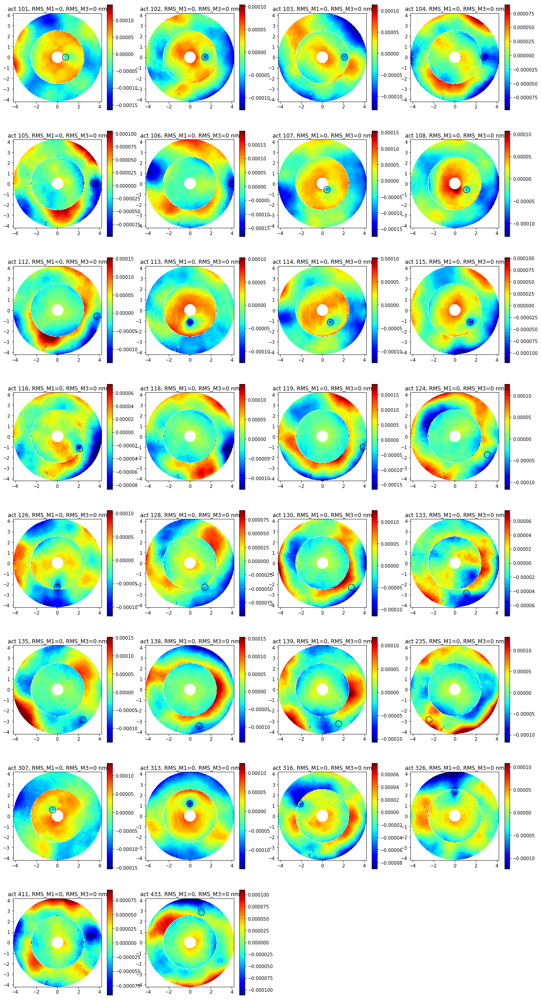

In [32]:
testID = '3-8' 
fig, ax = plt.subplots(8,4,figsize=(20,5*8))
i = 0
for modeID in sorted(mode2actID):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    i += 1
    print('%s bending mode %s ------ irow = %d, icol = %d, -----------------------------'%(
        testID, modeID, irow, icol))
    fileset = sorted(glob.glob('%s/Processed/%d_%s Influence Functions/Combined/*Residual*%d.h5'%(
    dataDir, dateID, testID, modeID)))
    m1s,centerRow1,centerCol1,pixelSize1 = readH5Map(fileset, '/M1Data')
    m3s,centerRow3,centerCol3,pixelSize3 = readH5Map(fileset, '/M3Data')

    [x1, y1] = mkXYGrid(m1s, centerRow1, centerCol1, pixelSize1)
    [x3, y3] = mkXYGrid(m3s, centerRow3, centerCol3, pixelSize3)
    s = mkM1M3disp(m1s, m3s, x1, y1, x3, y3)
    
    m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
    m3rms = np.std(m3s[~np.isnan(m3s)])*1000 #convert into nm

    vmean = np.mean(s[~np.isnan(s)])
    vmin = vmean-3*np.std(s[~np.isnan(s)]-vmean)
    vmax = vmean+3*np.std(s[~np.isnan(s)]-vmean)
    
    img = ax[irow][icol].imshow(s, origin='lower', extent = [x1[0,0], x1[0,-1], y1[0,0], y1[-1,0]], vmin=vmin, vmax=vmax)
    fig.colorbar(img, ax=ax[irow][icol])
    ax[irow][icol].set_title('act %d, RMS_M1=%.0f, RMS_M3=%.0f nm'%(modeID, m1rms, m3rms))
    
    actIdx = np.where(actID == modeID)[0][0]
    circ = Circle((xact[actIdx],yact[actIdx]),0.3, fill = False)
    ax[irow][icol].add_patch(circ)

fig.delaxes(ax.flatten()[-2])
fig.delaxes(ax.flatten()[-1])    